# **Style Transfer**

<img src="https://i0.wp.com/chelseatroy.com/wp-content/uploads/2018/12/neural_style_transfer.png?resize=768%2C311&ssl=1">

### **La idea de este trabajo final es reproducir el siguiente paper:**

https://arxiv.org/pdf/1508.06576.pdf

El objetivo es transferir el estilo de una imagen dada a otra imagen distinta. 

Como hemos visto en clase, las primeras capas de una red convolucional se activan ante la presencia de ciertos patrones vinculados a detalles muy pequeños.

A medida que avanzamos en las distintas capas de una red neuronal convolucional, los filtros se van activando a medida que detectan patrones de formas cada vez mas complejos.

Lo que propone este paper es asignarle a la activación de las primeras capas de una red neuronal convolucional (por ejemplo VGG19) la definición del estilo y a la activación de las últimas capas de la red neuronal convolucional, la definición del contenido.

La idea de este paper es, a partir de dos imágenes (una que aporte el estilo y otra que aporte el contenido) analizar cómo es la activación de las primeras capas para la imagen que aporta el estilo y cómo es la activación de las últimas capas de la red convolucional para la imagen que aporta el contenido. A partir de esto se intentará sintetizar una imagen que active los filtros de las primeras capas que se activaron con la imagen que aporta el estilo y los filtros de las últimas capas que se activaron con la imagen que aporta el contenido.

A este procedimiento se lo denomina neural style transfer.

**_En este trabajo se deberá leer el paper mencionado y en base a ello, entender la implementación que se muestra a continuación y contestar preguntas sobre la misma._**

**_Una metodología posible es hacer una lectura rápida del paper (aunque esto signifique no entender algunos detalles del mismo) y luego ir analizando el código y respondiendo las preguntas. A medida que se planteen las preguntas, volviendo a leer secciones específicas del paper terminará de entender los detalles que pudieran haber quedado pendientes._**


# Se Cargan las imágenes
Lo primero que haremos es cargar dos imágenes, una que aporte el estilo y otra que aporte el contenido. A tal fin utilizaremos imágenes disponibles en la web.

In [ ]:
# Imagen para estilo
!wget https://upload.wikimedia.org/wikipedia/commons/5/52/La_noche_estrellada1.jpg

# Imagen para contenido
!wget https://upload.wikimedia.org/wikipedia/commons/thumb/f/f4/Neckarfront_T%C3%BCbingen_Mai_2017.jpg/775px-Neckarfront_T%C3%BCbingen_Mai_2017.jpg

# Creamos el directorio para los archivos de salida
!mkdir /content/output

--2021-12-20 11:55:52--  https://upload.wikimedia.org/wikipedia/commons/5/52/La_noche_estrellada1.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 103.102.166.240, 2001:df2:e500:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|103.102.166.240|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 223725 (218K) [image/jpeg]
Saving to: ‘La_noche_estrellada1.jpg.1’

La_noche_estrellada 100%[===================>] 218.48K  1.28MB/s    in 0.2s    

2021-12-20 11:55:53 (1.28 MB/s) - ‘La_noche_estrellada1.jpg.1’ saved [223725/223725]

--2021-12-20 11:55:53--  https://upload.wikimedia.org/wikipedia/commons/thumb/f/f4/Neckarfront_T%C3%BCbingen_Mai_2017.jpg/775px-Neckarfront_T%C3%BCbingen_Mai_2017.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 103.102.166.240, 2001:df2:e500:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|103.102.166.240|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1530

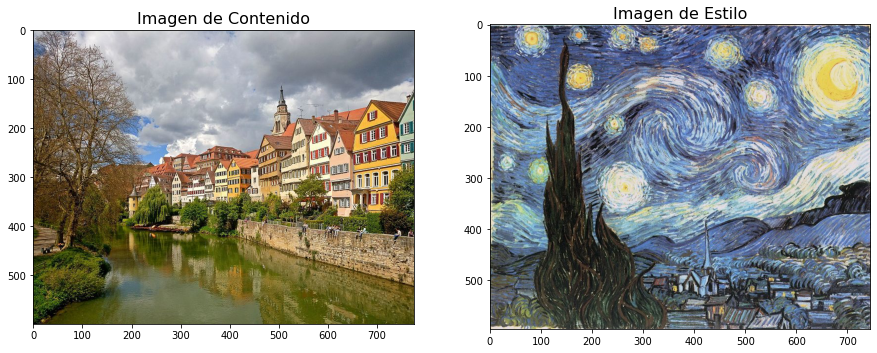

In [ ]:
from PIL import Image   
from matplotlib import pyplot as plt

# Abrir Imágenes
Content = Image.open('775px-Neckarfront_Tübingen_Mai_2017.jpg') 
Style = Image.open('La_noche_estrellada1.jpg')

# Mostrar Imágenes
plt.figure(figsize=(15,15)) 
plt.subplot(1, 2, 1)
plt.title("Imagen de Contenido", fontsize="16")
plt.imshow(Content)
plt.subplot(1, 2, 2)
plt.title("Imagen de Estilo", fontsize="16")
plt.imshow(Style)

In [ ]:
%tensorflow_version 1.x
from keras.preprocessing.image import load_img, save_img, img_to_array
import numpy as np
from scipy.optimize import fmin_l_bfgs_b
import time
import argparse

from keras.applications import vgg19
from keras import backend as K
from pathlib import Path

TensorFlow 1.x selected.


Using TensorFlow backend.


In [ ]:
# Definimos las imagenes que vamos a utilizar, y el directorio de salida

base_image_path = Path("/content/775px-Neckarfront_Tübingen_Mai_2017.jpg")
style_reference_image_path = Path("/content/La_noche_estrellada1.jpg")
result_prefix = Path("/content/output")
iterations = 100

# 1) En base a lo visto en el paper ¿Qué significan los parámetros definidos en la siguiente celda?

## **Respuesta:**

Los 3 parámetros definidos en las siguientes celdas son pesos que se le asignan a cada uno de los términos de nuestra función de costo con el fin de generar un fuerte énfasis hacia el contenido o hacia el estilo de nuestra imagen de salida.

### **_Dichos pesos son:_**

**Content_weight** ($\alpha$): Este peso es un **hiperparámetro** que se encarga de **asignar** un determinado **énfasis** o ponderación al término de nuestra función de costo llamado Content Loss, este término va a generar que nuestra imagen de salida se identifique con la imagen de contenido elegida como entrada al  minimizar la Función de Costo.

Un fuerte énfasis en el contenido va a generar una imagen de salida que se identifique con respecto a las formas y objetos de la imagen de contenido.

**Style_weight** ($\beta$): Este peso es un **hiperparámetro** que se encarga de **asignar** un determinado **énfasis** o ponderación al término de nuestra función de costo llamado Style Loss, este término va a generar que nuestra imagen de salida se identifique con la imagen de estilo al minimizar la Función de costo.

Un fuerte énfasis en el estilo va a generar una imagen de salida que coincida con las texturas y colores presentes en la imagen de estilo.

**Total_Variation_Weight** ($\gamma$): Este peso es un **hiperparámetro** que se encarga de **asignar** un determinado **énfasis** al término de nuestra función de costo llamado Total Variation Loss, este término va a actuar como un regularizador de los otros dos términos antes mencionados, que va a mejorar la suavidad de la imagen generada al minimizar la función de costo. 

En esencia, suavizamos las diferencias entre el estilo y la transferencia de contenido dentro de la imagen generada.

Por último, podemos ver que en el código se eligen unos determinados pesos ( $\alpha$= 1, $\beta$ = 10, $\gamma$= 0.1 ) que generarán un fuerte énfasis en el estilo por sobre el contenido y además se le asignará un leve alisamiento de la imagen.







In [ ]:
# Definimos el énfasis que tendrá la imagen
total_variation_weight = 0.1
style_weight = 10
content_weight = 1

In [ ]:
# Definimos el tamaño de las imágenes a utilizar
width, height = load_img(base_image_path).size
img_nrows = 400
img_ncols = int(width * img_nrows / height)

In [ ]:
# Content image
print(width, height) # Tamaño original

# Style image
width1, height1 = load_img(style_reference_image_path).size
print(width1, height1) #Tamaño original

# Nuevo tamaño de las imagenes de contenido, estilo y salida
print(img_ncols,img_nrows) 

775 599
745 596
517 400


# 2) Explicar qué hace la siguiente celda. En especial las últimas dos líneas de la función antes del return. ¿Por qué?

Ayuda: https://keras.io/applications/

## **Respuesta:**

La siguiente celda es una función que toma la imagen que se quiere pre procesar, recibe la ruta de la ubicación, carga la imagen y asigna el tamaño de alto y ancho, luego lo convierte la imagen en un archivo numpy array, donde cada bit de la imagen va a variar de **0 a 255**.

La anteúltima línea de código, el método $expand$_$dims$( ) expande el array de la imagen agregando un nuevo eje, de **(400, 517, 3)** a **(1, 400, 517, 3)**, para el caso de nuestras imágenes. Esta nueva dimensión es para agregar el batch de la imagen.

Debido a que Keras espera un tipo especifico de entradas en función a como se entrenó el modelo, se utiliza el método $preprocess$_$input$() para adecuar la imagen al formato requerido por la **vgg19**.

**vgg19** es un modelo de keras de imágenes pre entrenadas con los pesos de ImageNet.

La última línea de código, entonces convertirá las imágenes de entrada de **RGB** a **GBR** y luego centrará en cero cada canal de color con respecto al dataset de ImageNet, pero sin escalar.

 


In [ ]:
def preprocess_image(image_path):
    img = load_img(image_path, target_size=(img_nrows, img_ncols))
    img = img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = vgg19.preprocess_input(img)
    return img

![VGG19](https://miro.medium.com/max/1276/1*gASPVOwJJq-EoviO02Iw0w.jpeg)

Gráfico que explica como es la implementación de una **VGG19**. 

# 3) Habiendo comprendido lo que hace la celda anterior, explique de manera muy concisa qué hace la siguiente celda. ¿Qué relación tiene con la celda anterior?

## **Respuesta:**

La celda siguiente describe una función que hace un reshape al array de la imagen para sacar el batch size, así volverla a su estado original o sea: **(400, 517, 3)**.

Luego, las siguientes líneas de código eliminan el centrado en cero de cada canal de color con respecto al dataset de ImageNet.

Las últimas líneas de código vuelve de **BGR** a **RGB** y normaliza los pixeles de la imagen con el método $clip()$, primero convirtiendo todos los valores inferiores a 0 en 0 y todos los valores superiores a 255 los convierte en 255. A esto lo transforma en uint8, para asi terminar con la normalización de los pixeles de la imagen.




In [ ]:
def deprocess_image(x):
    x = x.reshape((img_nrows, img_ncols, 3))
    # Remove zero-center by mean pixel
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    # 'BGR'->'RGB'
    x = x[:, :, ::-1]
    x = np.clip(x, 0, 255).astype('uint8')
    return x

In [ ]:
# get tensor representations of our images
# K.variable convierte un numpy array en un tensor, para 
base_image = K.variable(preprocess_image(base_image_path))
style_reference_image = K.variable(preprocess_image(style_reference_image_path))

Instructions for updating:
If using Keras pass *_constraint arguments to layers.


In [ ]:
combination_image = K.placeholder((1, img_nrows, img_ncols, 3))

Aclaración:

La siguiente celda sirve para procesar las tres imagenes (contenido, estilo y salida) en un solo batch.

In [ ]:
# combine the 3 images into a single Keras tensor
input_tensor = K.concatenate([base_image,
                              style_reference_image,
                              combination_image], axis=0)

In [ ]:
# build the VGG19 network with our 3 images as input
# the model will be loaded with pre-trained ImageNet weights
model = vgg19.VGG19(input_tensor=input_tensor,
                    weights='imagenet', include_top=False)
print('Model loaded.')

# get the symbolic outputs of each "key" layer (we gave them unique names).
outputs_dict = dict([(layer.name, layer.output) for layer in model.layers])


80142336/80134624 [==============================] - 8s 0us/step
Model loaded.


# 4) En la siguientes celdas:

- ¿Qué es la matriz de Gram?¿Para qué se usa?
- ¿Por qué se permutan las dimensiones de x?

## **Respuesta 1:**

**Matriz de Gram:** Es una matriz formada por el producto punto de dos pares de cualesquiera $F$ vectores en un espacio euclidiano n-dimensional, o sea es una matriz de la forma: $ G = F_i F_j^T$

Se utiliza para comparar que tan similar es $F_i$ de $F_j$.

El resultado de esta operación es una matriz de dimensión $(n_c , n_c)$ donde $n_c$ es el número de filtros y el valor de $G_{ij}$ mide que tan similar son las activaciones de los filtros _i_, respecto de las activaciones de los filtros _j_.

Matriz de Gram:
$$ G^l_{ij} = \sum_k F^l_{ik}F^l_{jk} $$

![gram.png](https://pytorchtaipei.github.io/images/articles/StyleTransfer/gram.png)


## **Respuesta 2**

Las dimensiones de $\vec{X}$ se permutan porque la matriz de gram es de tipo $G=FF^T$. 








In [ ]:
def gram_matrix(x):
    features = K.batch_flatten(K.permute_dimensions(x, (2, 0, 1)))
    gram = K.dot(features, K.transpose(features))
    return gram

# 5) Losses:

# Explicar qué mide cada una de las losses en las siguientes tres celdas.

## **Respuesta:**

Antes que nada, es importante tener en cuenta que estamos comparando la **imagen de entrada original** con la **imagen generada de salida**. Esas diferencias representan la $Loss$ y esta $Loss$ la queremos minimizar.
También es importante acarar los siguientes conceptos:

* Se define el **_contenido de una imagen_** por sus objetos y son en las capas superiores (las ultimas capas) de la CNN que capturan el contenido de alto nivel en terminos de formas, objetos, etc.

* Se define el **_estilo de una imagen_** por sus texturas y son en las capas inferiores (las primeras capas) de la CNN que capturan el estilo de la imagen en terminos de texturas, colores, etc.

### **_Existen 3 tipos de losses a saber:_**

* ### **_Content Loss:_**

Los feature maps en **capas superiores** de la CNN se activan en presencia de diferentes objetos. Entonces, si dos imágenes tienen el mismo contenido, deberían tener activaciones similares en las capas superiores.
Esta es la premisa para definir la **Content Loss**.
Esta Content Loss busca minimizar las diferencias de los feature maps de la imagen de contenido respecto de los feature maps de la imagen generada de salida.

**_En términos matemáticos podemos definirla como:_**

Sea $\vec{p}$ y $\vec{x}$ la imagen original y la imagen generada de salida, tambien sea $P^l$ y $F^l$ sus respectivos **Feature Maps** representados en la capa $l$: Vamos a definir la **Content Loss** como el **Error Cuadrático Medio** **_(MSE)_** entre estos dos Feature Maps:

$$ L_{content}(\vec{p},\vec{x},{l})= \frac{1}{2} \sum_{i,j}(F_{ij}^l-P_{ij}^l)^2 $$

* ### **_Style Loss:_**

El objetivo de la **Style Loss** es minimizar la **distancia cuadratica media** **_(MSE)_** entre las entradas de la **Matriz de Gram** de la imagen original y la **Matriz de Gram** de la imagen generada de salida.

**_En términos matemáticos podemos definirla como:_**

Sea $A^l$ y $G^l$ las respectivas **Matrices de Gram** correspondientes a la imagen original y la imagen generada de salida, con sus respectivas representaciones de estilo en la capa $l$ y sea $N$ la cantidad de filtros y  $M$ el producto entre el alto y el ancho del Feature Map.

* $  E_l = \frac{1}{4N_l^2M_l^2} \sum_{i,j} (G_{ij}^l - A_{ij}^l)^2 $

Esta fórmula que representa la loss de estilo no está completa ya que faltaría agregar los pesos, entonces:

Sea $w_l$ los pesos de cada capa $l$ que contribuyen a la **Style Loss** total y sea $\vec{a}$ y $\vec{x}$ la imagen original y la imagen generada de salida:

La **Style Loss** queda definida como el producto entre el **Error Cuadrático Medio** **_(MSE)_** de las dos Matrices de Gram ($E_l$) y los pesos relativos ($w_l$) que se le da a cada capa $l$ que contribuye al estilo:

$$ L_{style}(\vec{a},\vec{x})=\sum_{i,j}^Lw_lE_l $$

* ### **_Total Variation Loss:_**

Para generar imágenes que mezclen el contenido de una fotografía con el estilo de una pintura debemos minimizar conjuntamente la distancia entre una imagen de ruido blanco con representación del contenido de la fotografía en una capa de la CNN y la representación del estilo de la pintura en varias capas de la CNN.

Sea $\vec{p}$ la fotografía, $\vec{a}$ la pintura la función de costo que deseamos minimizar va a quedar definida como:

$$L_{total}(\vec{p},\vec{a},\vec{x})=\alpha L_{content}(\vec{p},\vec{x})+\beta L_{style}(\vec{a},\vec{x})$$

A estos dos términos usados en el  paper para calcular la **Total Loss**, hay que agregarle un tercer termino llamado **Total Variation Loss**.

La **Total Variation Loss** actúa como un regularizador que mejora la suavidad en la imagen generada. Esto **_no se usó en el paper original_** pero mejora los resultados evitando salidas muy ruidosas y resultados demasiado pixelados. En esencia, suavizamos las diferencias entre estilo y transferencia de contenido dentro de la imagen generada.

Sea $\vec{x}$ la imagen generada de salida que hay que suavizar y $\delta$ un hiperparámetro de suavizado:

$$ L_{tv}(\vec{x})= \sum_{i,j}( (x_{i,j+1}-x_{ij})^2+(x_{ij}-x_{i+1,j})^2 )^\delta $$

*  ### **_Total Loss:_**

Todos las **Losses** anteriormente mensionados son los términos que sumados conforman la **Función de Costo Total**.

Entonces sea $\vec{p}$ la fotografía, $\vec{a}$ la pintura, $\vec{x}$ la imagen generada de salida, $\alpha$, $\beta$ y $\gamma$ los hiperparámetros (los pesos) que determinan el énfasis entre contenido y estilo que va a tener la imagen de salida.

La **_Función de Costo Total_** será:

$$L_{total}(\vec{p},\vec{a},\vec{x})=\alpha L_{content}(\vec{p},\vec{x})+\beta L_{style}(\vec{a},\vec{x})+\gamma L_{tv}(\vec{x})$$







In [ ]:
def style_loss(style, combination):
    assert K.ndim(style) == 3
    assert K.ndim(combination) == 3
    S = gram_matrix(style)
    C = gram_matrix(combination)
    channels = 3
    size = img_nrows * img_ncols
    return K.sum(K.square(S - C)) / (4.0 * (channels ** 2) * (size ** 2))

In [ ]:
def content_loss(base, combination):
    return K.sum(K.square(combination - base))


In [ ]:
def total_variation_loss(x):
    assert K.ndim(x) == 4
    a = K.square(
        x[:, :img_nrows - 1, :img_ncols - 1, :] - x[:, 1:, :img_ncols - 1, :])
    b = K.square(
        x[:, :img_nrows - 1, :img_ncols - 1, :] - x[:, :img_nrows - 1, 1:, :])
    return K.sum(K.pow(a + b, 1.25))


In [ ]:
# Armamos la loss total
loss = K.variable(0.0)
layer_features = outputs_dict['block5_conv2']
base_image_features = layer_features[0, :, :, :]
combination_features = layer_features[2, :, :, :]
loss = loss + content_weight * content_loss(base_image_features,
                                            combination_features)

feature_layers = ['block1_conv1', 'block2_conv1',
                  'block3_conv1', 'block4_conv1',
                  'block5_conv1']
for layer_name in feature_layers:
    layer_features = outputs_dict[layer_name]
    style_reference_features = layer_features[1, :, :, :] 
    combination_features = layer_features[2, :, :, :]
    sl = style_loss(style_reference_features, combination_features)
    loss = loss + (style_weight / len(feature_layers)) * sl
loss = loss + total_variation_weight * total_variation_loss(combination_image)

In [ ]:
grads = K.gradients(loss, combination_image)

outputs = [loss]
if isinstance(grads, (list, tuple)):
    outputs += grads
else:
    outputs.append(grads)

f_outputs = K.function([combination_image], outputs)

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where



# 6) Explique el propósito de las siguientes tres celdas. ¿Qué hace la función **_fmin_l_bfgs_b_**? ¿En qué se diferencia con la implementación del paper? ¿Se puede utilizar alguna alternativa?

* ## **Respuesta 1:**

### **_El propósito de las siguientes 3 celdas es el siguiente:_**

Como calcular la Loss y el Gradiente de forma independiente es extremadamente ineficiente, entonces se implementa un **evaluador**, que calcula la Loss y el Gradiente de forma conjunta y los devuelde por separado.

El último paso es iterar el optimizador varias veces hasta que logremos **minimizar la Loss** y obtengamos el resultado deseado. Luego se guarda el resultado a lo largo de las iteraciones para comprobar que el modelo tiene un funcionamiento óptimo.

* ## **Respuesta 2:**

Para explicar la función **fmin_l_bfgs_b** primero vamos a explicar que es el algoritmo **L-BFGS-B**.

El algoritmo **L-BFGS-B** es un algoritmo de optimización basado en el gradiente cuasi-Newton de memoria limitada que resuelve problemas de funciones de restricciones simples, del tipo:
````
minimizar f(x)
tal que: l <= x <= u
````
Se trata de un método que hace un uso limitado de la memoria ya que usa mucha menos que otros tipo de algoritmos equivalentes para el mismo problema.
El método **L-BFGS_B** de memoria limitada no almacena la Matriz Hessiana completa, pero trata de aproximarla, de ahí reside su eficiencia en el uso de memoria.

Una de las limitaciones del algoritmo **L-BFGS_B** es que requiere que la **Loss** y los **gradientes** se pasen por separado. Dado que calcularlos de forma independiente sería extremadamente ineficiente, se implementa el calculo de ambas en conjunto, creando una clase $Evaluator$( ) que calcula los valores de la **Loss** y los **Gradientes** a la vez, pero los devuelve por separado.

Estos valores de **Loss** calculados por la Clase $Evaluator$( ) luego serán utilizados por la función **fmin_l_bfgs_b** para minimizarlos hasta obtener una **Loss** óptima que nos de una **imagen generada de salida** deseada.

En definitiva, la función **fmin_l_bfgs_b** minimiza una función $func$ usando el algoritmo **L-BFGS-B**.

* ### **_Documentación:_**

$fmin$ _ $l$ _ $bfgs$_$b$($func$, $X_0$, $f_{prime}$, $maxfun$)

Donde:

$func$ = Función que se busca minimizar.

$X_0$= Estimación inicial.

$f_{prime}$= Gradiente de la Función $func$.

$maxfun$= Número máximo de evaluaciones de la función.

* ## **Respuesta 3:**

### _**Optimizador:**_

La implementación realizada en este **Trabajo Práctico Final** se diferencia respecto a la implementación hecha en el **paper**, en que nosotros usamos el algoritmo de optimización **L-BFGS-B**, mientras que el **paper** si bien no mensiona el optimizador usado, en otras publicaciones* se mensiona que el paper utilizó **L-BFGS**. 

*Ver: [medium](https://medium.com/analytics-vidhya/understanding-and-implementing-neural-style-transfer-7d752d3cfe74), [towardsdatascience](https://towardsdatascience.com/artificial-intelligence-meets-art-neural-transfer-style-50e1c07aa7f7)
y [Deep Learning with Python](https://drive.google.com/file/d/1SpbqHF7__KC8LFHno0mDQOAJSIlbPW0F/view?usp=sharing) (ver pág.  315).

* **_Comparamos ambos optimizadores:_**

**L-BFGS** permite obtener el mínimo de una función, únicamente necesita la función y su gradiente, pero no la matriz Hessiana, tambien es capaz de resolver funciones sin restricciones, mientras que la variante **L-BFGS-B** puede resolver funciones con restricciones simples en sus parámetros y para cada iteración el algoritmo busca una aproximación de la matriz Hessiana.

### **_Pooling:_**


En la implementación del **paper** se usó **average pooling***, mientras que en la implementación realizada en este Trabajo Práctico Final al tener los argumentos: ``include_top=False`` y ``pooling= None``, no se  implementó ninguna técnica de pooling en particular, esto significa que la salida del modelo es la salida del tensor 4D del último bloque convolucional.

*Ver [paper](https://arxiv.org/pdf/1508.06576.pdf) página 9.

### **_Imagenes Comparativas:_**
![comparación](https://miro.medium.com/max/1200/1*HinFZ5XQKP_Lc2YY0Esh6A.png)
Aqui se puede apreciar las diferencias al utilizar distintos tipos técnicas de pooling.

![otra comparacion](https://gudgud96.github.io/img/mean-vs-max-pool.png)
Aqui tambien se puede apreciar con otra imagen como se comportan: **avg** vs **max** pooling.

 ### **_Loss:_**
El paper no utilizó el término **variation loss**  para calcular la **Función de Costo Total** (**Total Loss**) mientras que en este Trabajo Tráctico Final si se implementa este término en nuestra Fórmula final de la **Total Loss**.

Ver: [paper](https://arxiv.org/pdf/1508.06576.pdf) página 12.

* ## **Respuesta 4:**

La otra alternativa que se puede utilizar es **Adam**, un optmimizador que en general funciona bien para trabajar con imagenes.





In [ ]:
def eval_loss_and_grads(x):
    x = x.reshape((1, img_nrows, img_ncols, 3))
    outs = f_outputs([x])
    loss_value = outs[0]
    if len(outs[1:]) == 1:
        grad_values = outs[1].flatten().astype('float64')
    else:
        grad_values = np.array(outs[1:]).flatten().astype('float64')
    return loss_value, grad_values

# this Evaluator class makes it possible
# to compute loss and gradients in one pass
# while retrieving them via two separate functions,
# "loss" and "grads". This is done because scipy.optimize
# requires separate functions for loss and gradients,
# but computing them separately would be inefficient.

In [ ]:
class Evaluator(object):

    def __init__(self):
        self.loss_value = None
        self.grads_values = None

    def loss(self, x):
        assert self.loss_value is None
        loss_value, grad_values = eval_loss_and_grads(x)
        self.loss_value = loss_value
        self.grad_values = grad_values
        return self.loss_value

    def grads(self, x):
        assert self.loss_value is not None
        grad_values = np.copy(self.grad_values)
        self.loss_value = None
        self.grad_values = None
        return grad_values

# 7) Ejecute la siguiente celda y observe las imágenes de salida en cada iteración.

In [ ]:
evaluator = Evaluator()

# run scipy-based optimization (L-BFGS) over the pixels of the generated image
# so as to minimize the neural style loss
x = preprocess_image(base_image_path)

for i in range(iterations):
    print('Start of iteration', i)
    start_time = time.time()
    x, min_val, info = fmin_l_bfgs_b(evaluator.loss, x.flatten(),
                                     fprime=evaluator.grads, maxfun=20)
    print('Current loss value:', min_val)
    # save current generated image
    img = deprocess_image(x.copy())
    fname = result_prefix / ('output_at_iteration_%d.png' % i)
    save_img(fname, img)
    end_time = time.time()
    print('Image saved as', fname)
    print('Iteration %d completed in %ds' % (i, end_time - start_time))

Start of iteration 0
Current loss value: 13278365000.0
Image saved as /content/output/output_at_iteration_0.png
Iteration 0 completed in 22s
Start of iteration 1
Current loss value: 6507943000.0
Image saved as /content/output/output_at_iteration_1.png
Iteration 1 completed in 15s
Start of iteration 2
Current loss value: 4392987600.0
Image saved as /content/output/output_at_iteration_2.png
Iteration 2 completed in 15s
Start of iteration 3
Current loss value: 3320891600.0
Image saved as /content/output/output_at_iteration_3.png
Iteration 3 completed in 15s
Start of iteration 4
Current loss value: 2680132000.0
Image saved as /content/output/output_at_iteration_4.png
Iteration 4 completed in 15s
Start of iteration 5
Current loss value: 2302199000.0
Image saved as /content/output/output_at_iteration_5.png
Iteration 5 completed in 15s
Start of iteration 6
Current loss value: 2069208600.0
Image saved as /content/output/output_at_iteration_6.png
Iteration 6 completed in 15s
Start of iteration 

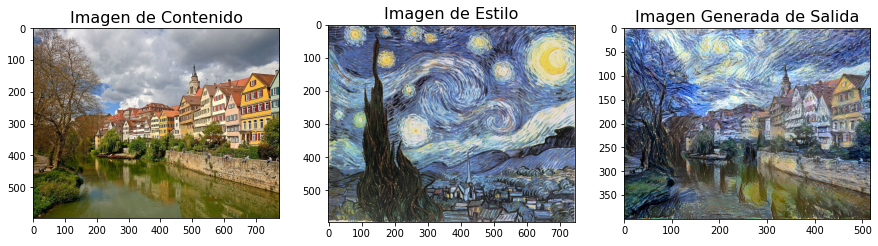

In [ ]:
# Abrir Imágenes 
Content = Image.open('775px-Neckarfront_Tübingen_Mai_2017.jpg') 
Style = Image.open('La_noche_estrellada1.jpg')
Salida = Image.open('1.png')

# Mostrar Imágenes
plt.figure(figsize=(15,15)) 
plt.subplot(1, 3, 1)
plt.title("Imagen de Contenido", fontsize="16")
plt.imshow(Content)
plt.subplot(1, 3, 2)
plt.title("Imagen de Estilo", fontsize="16")
plt.imshow(Style)
plt.subplot(1, 3, 3)
plt.title("Imagen Generada de Salida", fontsize="16")
plt.imshow(Salida)

# 8) Generar imágenes para distintas combinaciones de pesos de las losses. Explicar las diferencias. 

## Adjuntar las imágenes generadas como archivos separados.

## **Respuestas:**




* $Imagenes$ $1$ y $2:$

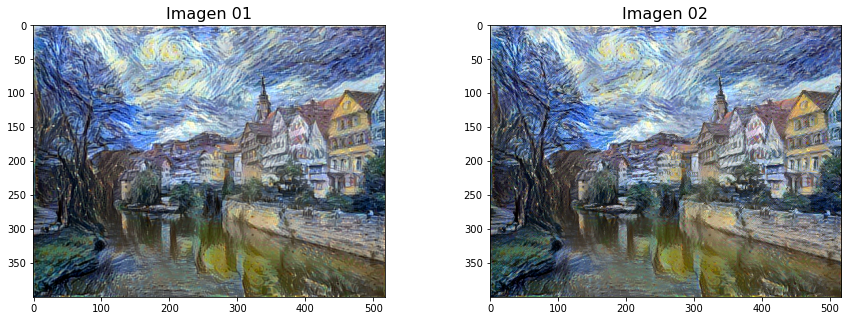

In [ ]:
# Abrir Imágenes 
I1 = Image.open('1.png') 
I2 = Image.open('2.png') 

# Mostrar Imágenes
plt.figure(figsize=(15,5)) 
plt.subplot(1, 2, 1)
plt.title("Imagen 01", fontsize="16")
plt.imshow(I1)
plt.subplot(1, 2, 2)
plt.title("Imagen 02", fontsize="16")
plt.imshow(I2)

**_Las imágenes 1 y 2 fueron entrenadas con los siguientes pesos:_**
````
Imagen 1:
total_variation_weight = 0.1
style_weight = 10
content_weight = 1

Imagen 2:
total_variation_weight = 0
style_weight = 10
content_weight = 1
````

Podemos ver que estás dos imágenes hacen un fuerte **énfasis** en el estilo por sobre el contenido, dándole **color y texturas** asociadas a la **imagen de estilo**.

Por otro lado podemos **contrastar** ambas imágenes de salida con respecto al **peso** que se le da a la **Variación Total**, la **primera imagen** es el resultado de calcular la Loss **utilizando** el término de la **Variación Total**, mientras que la **segunda imagen** es el resultado de **no utilizar** la **Variación Total** en el cálculo de la Loss.
Por este motivo la **primera imagen** se puede observar una imagen levemente **suavizada** mientras la **segunda imagen** se observa levemente **pixelada** respecto de la primera.


* $Imagenes$ $3$ y $4:$

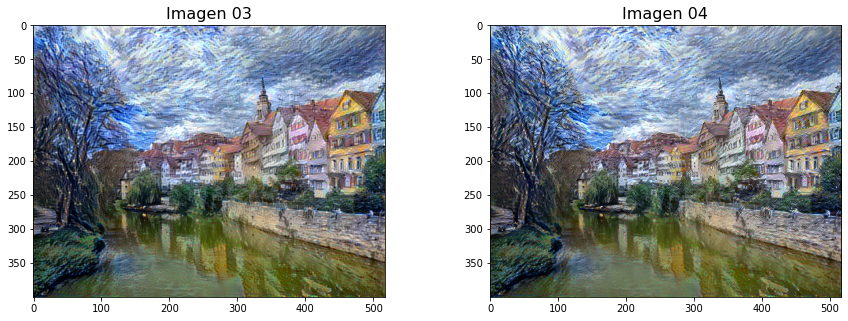

In [ ]:
# Abrir Imágenes 
I3 = Image.open('3.png') 
I4 = Image.open('4.png') 

# Mostrar Imágenes
plt.figure(figsize=(15,5)) 
plt.subplot(1, 2, 1)
plt.title("Imagen 03", fontsize="16")
plt.imshow(I3)
plt.subplot(1, 2, 2)
plt.title("Imagen 04", fontsize="16")
plt.imshow(I4)

**_Las imágenes 3 y 4 fueron entrenadas con los siguientes pesos:_**
````
Imagen 3:
total_variation_weight = 0.1
style_weight = 1
content_weight = 10

Imagen 4:
total_variation_weight = 0
style_weight = 1
content_weight = 10
````
Podemos ver que estás dos imágenes hacen un fuerte **énfasis** en el **contenido** por sobre el estilo, dando asi **mayor importancia** a las **formas y objetos** asociadas a la **imagen de contenido**. Por otro lado la **imagen 3** usa el término de la Variación Total asignado un peso de 0.1, para así calcular la Función de Costo Total y lograr un **acabado más suave**, mientras que la **imagen 4** no utiliza ningún peso para la Variación total, esto va a generar una **imagen más pixelada** que la anterior.

* $Imagenes$ $5$ y $6:$

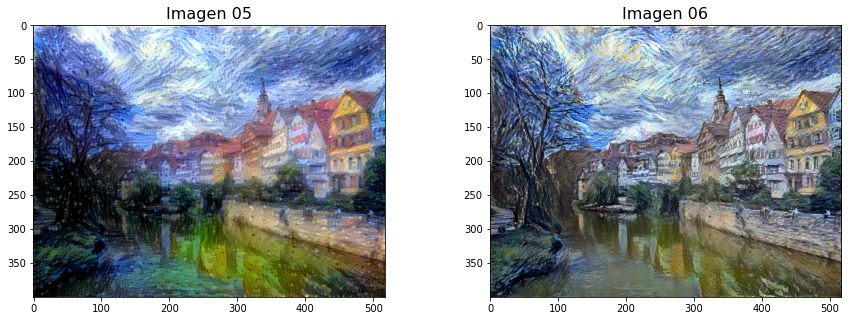

In [ ]:
# Abrir Imágenes 
I5 = Image.open('5.png') 
I6 = Image.open('6.png')

# Mostrar Imágenes
plt.figure(figsize=(15,5)) 
plt.subplot(1, 2, 1)
plt.title("Imagen 05", fontsize="16")
plt.imshow(I5)
plt.subplot(1, 2, 2)
plt.title("Imagen 06", fontsize="16")
plt.imshow(I6)

**_Estas imágenes fueron entrenadas con los siguientes pesos:_**
````
Imagen 5:
total_variation_weight = 1
style_weight = 1
content_weight = 1

Imagen 6:
total_variation_weight = 0
style_weight = 1
content_weight = 1
````
En la **imagen 5** se puso el mismo valor de peso para todos los términos de la Total Loss, o sea: $\alpha = \beta = \gamma= 1$,  lo que genera una imagen más equilibrada, se observa sin embargo que presenta una mayor proporción, de los **colores** vivos y de las **texturas** propias de la imagen de contenido, sin embargo las **formas y objetos** no se llegan a apreciar tanto ya que se ven algo borrosas.

Por otra parte, en la **Imagen 6** los pesos de las Losses parciales para minimizar el estilo y el contenidos $\alpha$ y $\beta$ valen $1$, mientras que el peso $(\gamma)$ para la Loss de la Variación Total vale $0$, el **resultado** es una imagen generada de salida, con **colores y matices opacas** propias de la imagen de estilo, pero con las **formas y objetos bien preservados y apreciables**, heredadas por la imagen de contenido.


* $Imagenes$ $7$ y $8:$

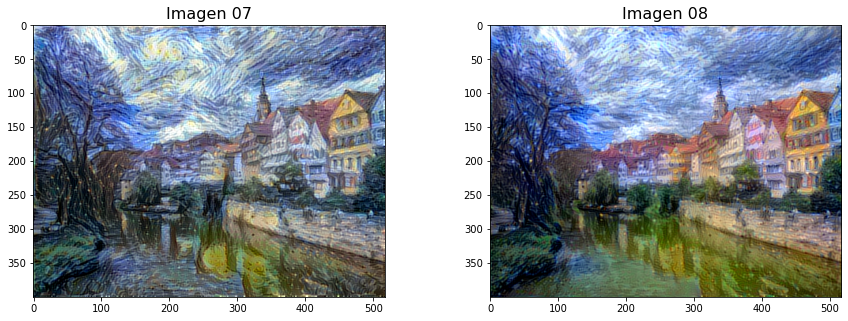

In [ ]:
# Abrir Imágenes 
I7 = Image.open('7.png') 
I8 = Image.open('8.png') 

# Mostrar Imágenes
plt.figure(figsize=(15,5)) 
plt.subplot(1, 2, 1)
plt.title("Imagen 07", fontsize="16")
plt.imshow(I7)
plt.subplot(1, 2, 2)
plt.title("Imagen 08", fontsize="16")
plt.imshow(I8)

**_Las imágenes 7 y 8 fueron entrenadas con los siguientes pesos:_**
````
Imagen 7:
total_variation_weight = 1
style_weight = 10
content_weight = 1

Imagen 8:
total_variation_weight = 1
style_weight = 1
content_weight = 10
````
Observando las imágenes podemos decir que la **imagen 7** tiene un parecido a la imagen 1, mientras que la **imagen 8** tiene un parecido a la imagen 3, esto se debe a que fueron entrenados casi con los mismos pesos para cada término de la Total Loss.

La diferencia se puede apreciar respecto al aspecto que genera la variación total en las imágenes, este **énfasis logra resaltar** aun con más vigor los **colores en la imagen 8** mucho más que en la imagen 3, además la imagen 1 se observa más pixelada con respecto a la **imagen 7**, esto se debe a que la **imagen 7** fue entrenada con un **peso** $(\gamma)$ mucho **mayor**.




* $Imagenes$ $9$ y $10:$

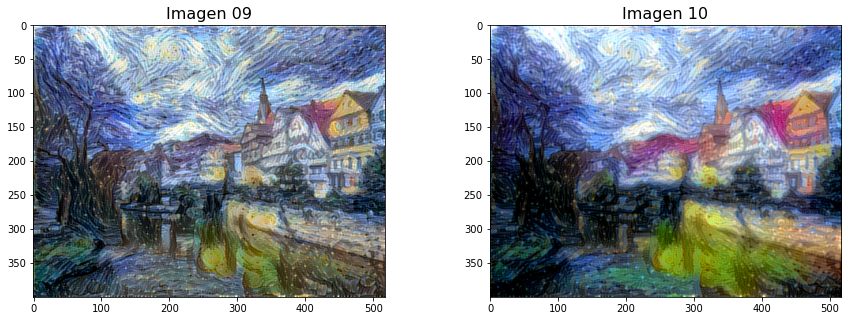

In [ ]:
# Abrir Imágenes 
I9 = Image.open('9.png') 
I10 = Image.open('10.png') 

# Mostrar Imágenes
plt.figure(figsize=(15,5)) 
plt.subplot(1, 2, 1)
plt.title("Imagen 09", fontsize="16")
plt.imshow(I9)
plt.subplot(1, 2, 2)
plt.title("Imagen 10", fontsize="16")
plt.imshow(I10)

**_Las imágenes 9 y 10 fueron entrenadas con los siguientes pesos:_**
````
Imagen 9:
total_variation_weight = 10
style_weight = 100
content_weight = 1

Imagen 10:
total_variation_weight = 100
style_weight = 100
content_weight = 1
````
El objetivo de las **Imágenes 9 y 10** era observar el resultado de **probar pesos grandes** para generar imágenes de salida. 

Se puede observar que la **imagen 9 y la imagen 10** son, el resultado de **aumentar los pesos** de las Losses de estilo y variación total de las imágenes 1 y 7, en dichas imágenes no se puede apreciar cambios perceptibles a simple vista, pero si las comparamos con la imagen 9 y 10 se puede ver cómo estas últimas **se van deformando** cada vez más, **debido al aumento del énfasis en el estilo por sobre el contenido**, por lo que las formas y objetos queda en un segundo plano.

Con respecto a las imágenes 1, 7 y 9 se ven prácticamente con la misma textura y colores opacos propios de la imagen de estilo, aunque la **imagen 9 se observa cómo se empiezan a deformar las formas y figuras como ventanas, bordes y líneas rectas**.

Por otra parte vemos en la **imagen 10** que las **formas y objetos se ven mucho más deformadas** que en las imágenes anteriores, pero **como contraparte**, se la observa mucho más **colorida**, con colores más representativos de la imagen de contenido que de estilo, a pesar de que el énfasis puesto en el contenido sea bajo.


# 9) Cambiar las imágenes de contenido y estilo por unas elegidas por usted. Adjuntar el resultado.

Respuesta:

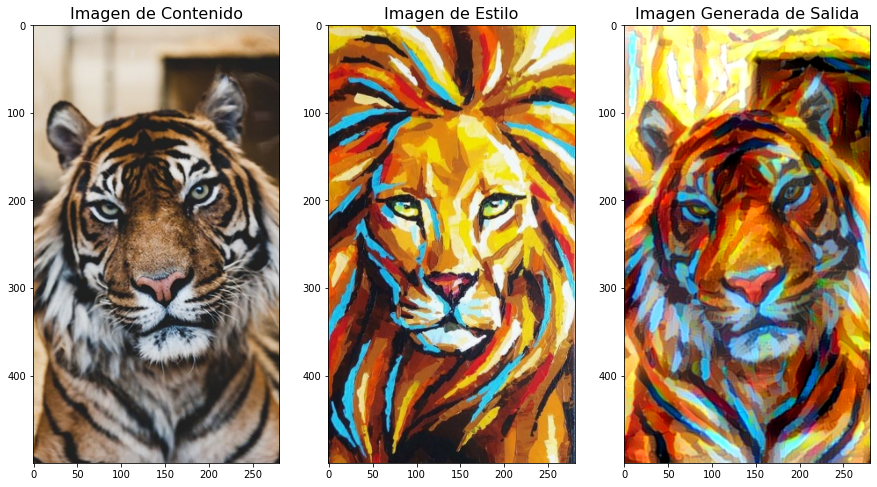

In [ ]:
# Abrir Imágenes 
Content = Image.open('content_1.jpg') 
Style = Image.open('style_1.jpg')
Salida = Image.open('salida_1.png')

# Mostrar Imágenes
plt.figure(figsize=(15,10)) 
plt.subplot(1, 3, 1)
plt.title("Imagen de Contenido", fontsize="16")
plt.imshow(Content)
plt.subplot(1, 3, 2)
plt.title("Imagen de Estilo", fontsize="16")
plt.imshow(Style)
plt.subplot(1, 3, 3)
plt.title("Imagen Generada de Salida", fontsize="16")
plt.imshow(Salida)

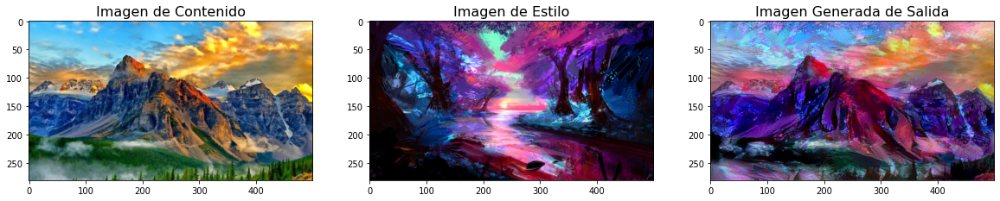

In [ ]:
# Abrir Imágenes 
Content = Image.open('content_2.jpg') 
Style = Image.open('style_2.jpg')
Salida = Image.open('salida_2.png')

# Mostrar Imágenes
plt.figure(figsize=(20,10)) 
plt.subplot(1, 3, 1)
plt.title("Imagen de Contenido", fontsize="16")
plt.imshow(Content)
plt.subplot(1, 3, 2)
plt.title("Imagen de Estilo", fontsize="16")
plt.imshow(Style)
plt.subplot(1, 3, 3)
plt.title("Imagen Generada de Salida", fontsize="16")
plt.imshow(Salida)

In [ ]:
from PIL import Image   
from matplotlib import pyplot as plt

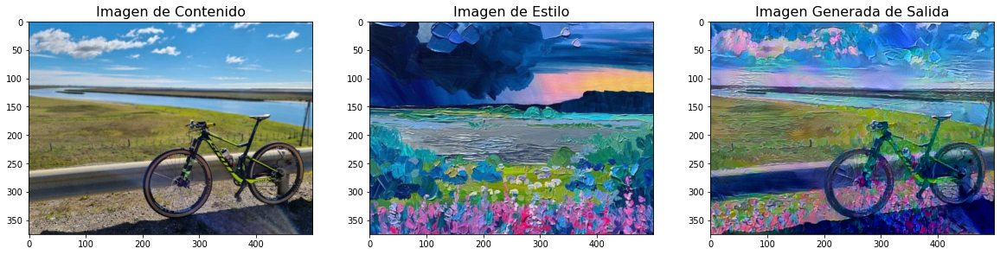

In [ ]:
# Abrir Imágenes 
Content = Image.open('content_3.jpg') 
Style = Image.open('style_3.jpg')
Salida = Image.open('salida_3.png')

# Mostrar Imágenes
plt.figure(figsize=(20,10)) 
plt.subplot(1, 3, 1)
plt.title("Imagen de Contenido", fontsize="16")
plt.imshow(Content)
plt.subplot(1, 3, 2)
plt.title("Imagen de Estilo", fontsize="16")
plt.imshow(Style)
plt.subplot(1, 3, 3)
plt.title("Imagen Generada de Salida", fontsize="16")
plt.imshow(Salida)

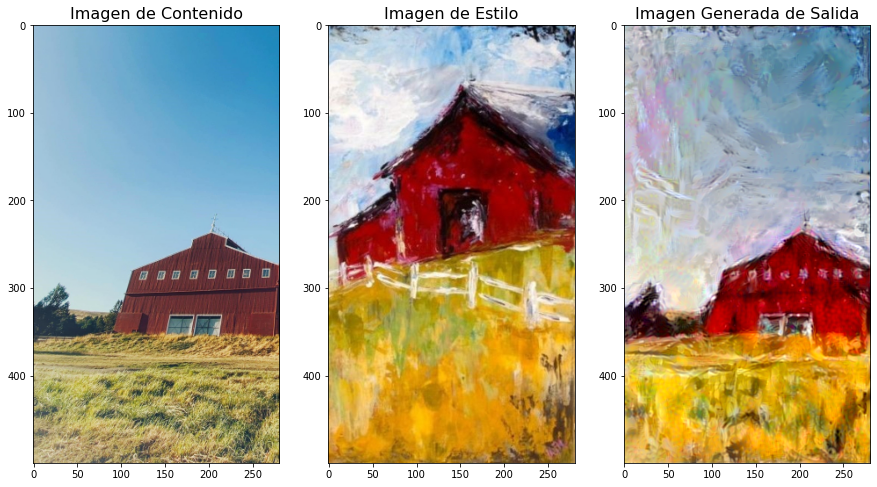

In [ ]:
# Abrir Imágenes 
Content = Image.open('content_4.jpg') 
Style = Image.open('style_4.jpg')
Salida = Image.open('salida_4.png')

# Mostrar Imágenes
plt.figure(figsize=(15,10)) 
plt.subplot(1, 3, 1)
plt.title("Imagen de Contenido", fontsize="16")
plt.imshow(Content)
plt.subplot(1, 3, 2)
plt.title("Imagen de Estilo", fontsize="16")
plt.imshow(Style)
plt.subplot(1, 3, 3)
plt.title("Imagen Generada de Salida", fontsize="16")
plt.imshow(Salida)

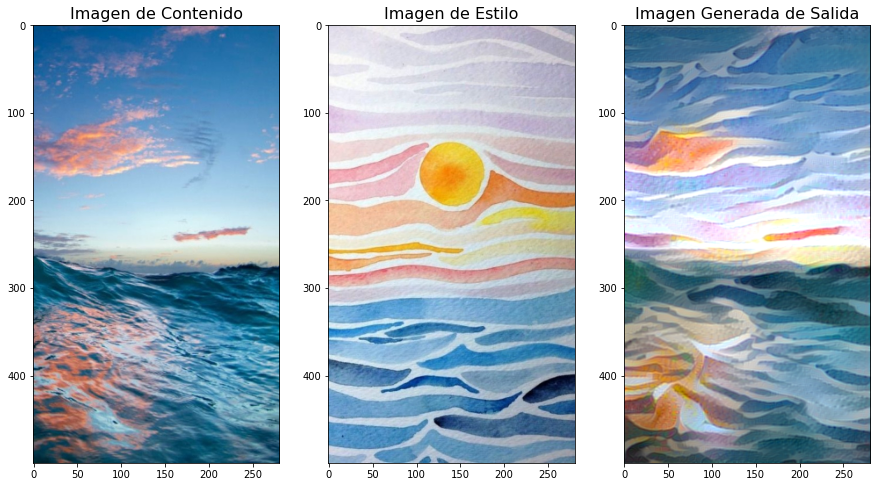

In [ ]:
# Abrir Imágenes 
Content = Image.open('content_5.jpg') 
Style = Image.open('style_5.jpg')
Salida = Image.open('salida_5.png')

# Mostrar Imágenes
plt.figure(figsize=(15,10)) 
plt.subplot(1, 3, 1)
plt.title("Imagen de Contenido", fontsize="16")
plt.imshow(Content)
plt.subplot(1, 3, 2)
plt.title("Imagen de Estilo", fontsize="16")
plt.imshow(Style)
plt.subplot(1, 3, 3)
plt.title("Imagen Generada de Salida", fontsize="16")
plt.imshow(Salida)

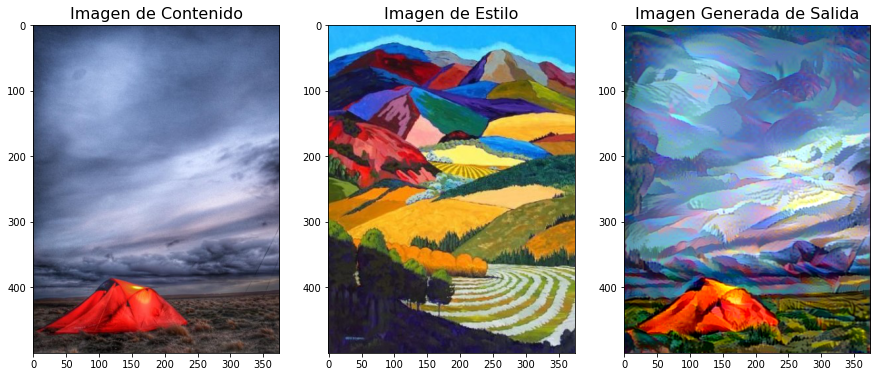

In [ ]:
# Abrir Imágenes 
Content = Image.open('content_6.jpg') 
Style = Image.open('style_6.jpg')
Salida = Image.open('salida_6.png')

# Mostrar Imágenes
plt.figure(figsize=(15,10)) 
plt.subplot(1, 3, 1)
plt.title("Imagen de Contenido", fontsize="16")
plt.imshow(Content)
plt.subplot(1, 3, 2)
plt.title("Imagen de Estilo", fontsize="16")
plt.imshow(Style)
plt.subplot(1, 3, 3)
plt.title("Imagen Generada de Salida", fontsize="16")
plt.imshow(Salida)

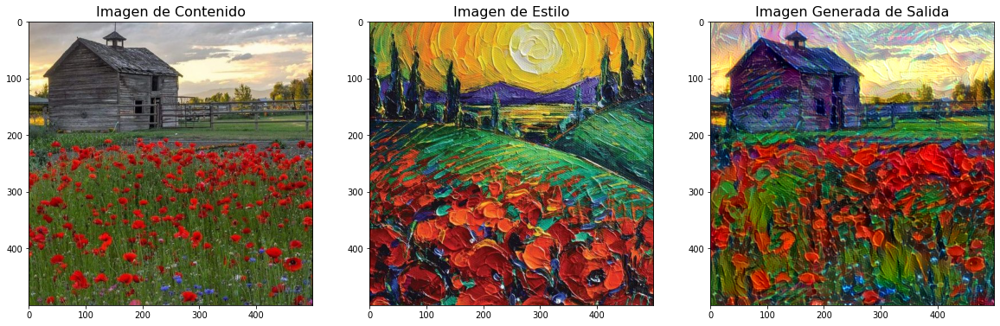

In [ ]:
# Abrir Imágenes 
Content = Image.open('content_7.jpg') 
Style = Image.open('style_7.jpg')
Salida = Image.open('salida_7.png')

# Mostrar Imágenes
plt.figure(figsize=(20,10)) 
plt.subplot(1, 3, 1)
plt.title("Imagen de Contenido", fontsize="16")
plt.imshow(Content)
plt.subplot(1, 3, 2)
plt.title("Imagen de Estilo", fontsize="16")
plt.imshow(Style)
plt.subplot(1, 3, 3)
plt.title("Imagen Generada de Salida", fontsize="16")
plt.imshow(Salida)

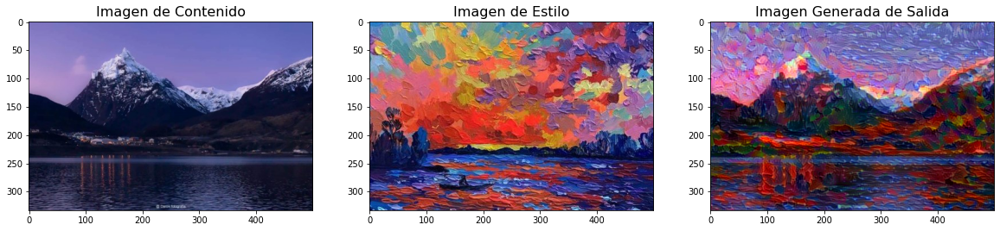

In [ ]:
# Abrir Imágenes 
Content = Image.open('content_8.jpg') 
Style = Image.open('style_8.jpg')
Salida = Image.open('salida_8.png')

# Mostrar Imágenes
plt.figure(figsize=(20,10)) 
plt.subplot(1, 3, 1)
plt.title("Imagen de Contenido", fontsize="16")
plt.imshow(Content)
plt.subplot(1, 3, 2)
plt.title("Imagen de Estilo", fontsize="16")
plt.imshow(Style)
plt.subplot(1, 3, 3)
plt.title("Imagen Generada de Salida", fontsize="16")
plt.imshow(Salida)

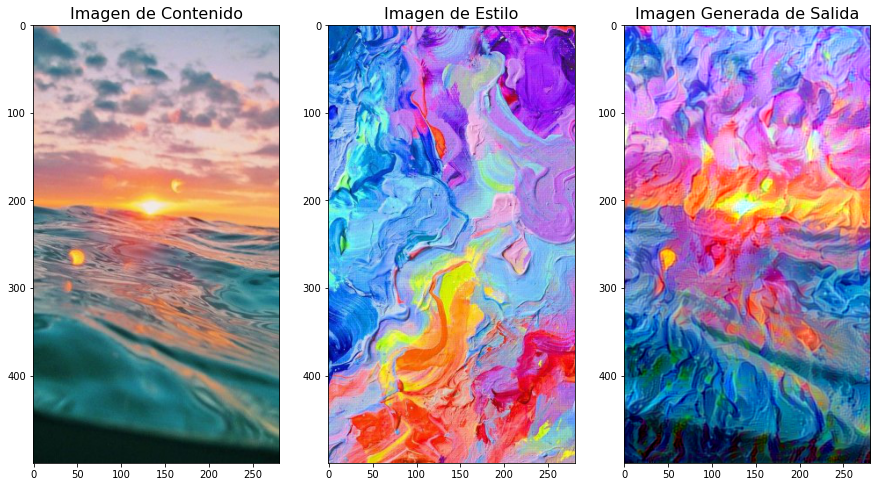

In [ ]:
# Abrir Imágenes 
Content = Image.open('content_9.jpg') 
Style = Image.open('style_9.jpg')
Salida = Image.open('salida_9.png')

# Mostrar Imágenes
plt.figure(figsize=(15,10)) 
plt.subplot(1, 3, 1)
plt.title("Imagen de Contenido", fontsize="16")
plt.imshow(Content)
plt.subplot(1, 3, 2)
plt.title("Imagen de Estilo", fontsize="16")
plt.imshow(Style)
plt.subplot(1, 3, 3)
plt.title("Imagen Generada de Salida", fontsize="16")
plt.imshow(Salida)

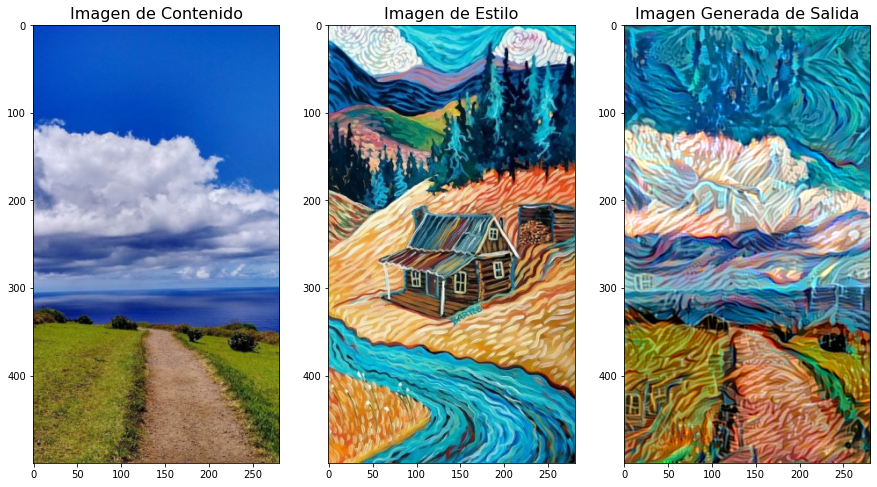

In [ ]:
# Abrir Imágenes 
Content = Image.open('content_10.jpg') 
Style = Image.open('style_10.jpg')
Salida = Image.open('salida_10.png')

# Mostrar Imágenes
plt.figure(figsize=(15,10)) 
plt.subplot(1, 3, 1)
plt.title("Imagen de Contenido", fontsize="16")
plt.imshow(Content)
plt.subplot(1, 3, 2)
plt.title("Imagen de Estilo", fontsize="16")
plt.imshow(Style)
plt.subplot(1, 3, 3)
plt.title("Imagen Generada de Salida", fontsize="16")
plt.imshow(Salida)

# **Bibliografía:**

### **_Pregunta 1:_**

https://arxiv.org/pdf/1508.06576.pdf  _página 6._

### **_Pregunta 2:_**

https://keras.io/api/applications/
https://keras.io/api/applications/vgg/#vgg19-function
https://www.tensorflow.org/api_docs/python/tf/keras/applications/vgg19/preprocess_input
https://www.tensorflow.org/tutorials/generative/style_transfer
https://numpy.org/doc/stable/reference/generated/numpy.expand_dims.html
https://stackoverflow.com/questions/54672631/what-is-in-keras-img-to-array-compared-to-bitmap-array-in-c

### **_Pregunta 3:_**

https://numpy.org/doc/stable/reference/generated/numpy.clip.html
https://stackoverflow.com/questions/64314899/how-does-numpy-astypenp-uint8-convert-a-float-array-1-2997805-became-255

### **_Pregunta 4:_**

https://arxiv.org/pdf/1508.06576.pdf  _páginas 10 y 11._

https://pytorchtaipei.github.io/images/articles/StyleTransfer/gram.png
https://www.datasciencecentral.com/profiles/blogs/deep-learning-amp-art-neural-style-transfer-an-implementation
https://slidetodoc.com/style-transfer-three-parts-1-introduction-to-the/
https://www.datasciencecentral.com/profiles/blogs/deep-learning-amp-art-neural-style-transfer-an-implementation
https://es.wikipedia.org/wiki/Matriz_de_Gram#:~:text=Es%20decir%3A-,Aplicaciones,de%20Gram%20no%20es%20nulo

### **_Pregunta 5:_**

https://towardsdatascience.com/neural-style-transfer-a-high-level-approach-250d4414c56b
https://keras.io/examples/generative/neural_style_transfer/
https://www.tensorflow.org/tutorials/generative/style_transfer#total_variation_loss
https://arxiv.org/pdf/1508.06576.pdf   _páginas 10, 11 y 12._

https://speakerdeck.com/hnarayanan/convolutional-neural-networks-for-artistic-style-transfer?slide=79
https://towardsdatascience.com/artificial-intelligence-meets-art-neural-transfer-style-50e1c07aa7f7
https://medium.com/analytics-vidhya/understanding-and-implementing-neural-style-transfer-7d752d3cfe74
https://keras.io/examples/generative/neural_style_transfer/

### **_Pregunta 6:_**

https://machinelearningmastery.com/bfgs-optimization-in-python/
https://github.com/bgranzow/L-BFGS-B/blob/master/README.md
https://es.wikipedia.org/wiki/L-BFGS
https://docs.scipy.org/doc/scipy/reference/generated/scipy.optimize.fmin_l_bfgs_b.html
https://www.tensorflow.org/tutorials/generative/style_transfer#run_gradient_descent
https://towardsdatascience.com/artificial-intelligence-meets-art-neural-transfer-style-50e1c07aa7f7
https://medium.com/analytics-vidhya/understanding-and-implementing-neural-style-transfer-7d752d3cfe74

### **_Pregunta 9:_**
https://sagittariusgallery.com/collections/on+a+starry+night

